In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import os
from tensorflow.keras import layers
from tensorflow.keras import Model
import datetime


## Reading data and creating patches
### gdrive should have images folder from BSDS500

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd gdrive/MyDrive

Mounted at /content/gdrive
/content/gdrive/MyDrive


In [ ]:
os.mkdir('images/train_patches')
os.mkdir('images/test_patches')

In [ ]:
def generate_patches(path,p_size,cr,save=''):
  img=cv2.imread(path)
  patches=[]
  path=path.split('/')[-1]
  path=path.split('.')[0]
  for c in cr:
    h,w=int(img.shape[0]*c),int(img.shape[1]*c)
    img_sc=cv2.resize(img, (h,w), interpolation=cv2.INTER_CUBIC)
    for i in range(0,h-p_size+1,p_size):
      for j in range(0,w-p_size+1,p_size):
        patch=img[i:i+p_size,j:j+p_size]
        patches.append(patch)
        if save!='':
          path1=save+'/'+path+str(i)+str(h)+str(j)+'.jpg'
          cv2.imwrite(path1,patch)
  return patches
def genimage(patches,size):
  img=np.zeros(size)
  p_size=patches.shape[1]
  p=0
  for i in range(0,img.shape[0]-p_size+1,p_size):
    for j in range(0,img.shape[1]-p_size+1,p_size):
      img[i:i+p_size,j:j+p_size]=patches[p]
      p+=1
  return np.array(img)

In [ ]:
def gen_data(img_dir,cr,p_size,save=''):
  images=os.listdir(img_dir)
  data=[]
  for i in images:
    # print(i)
    if i.split('.')[-1]=='jpg':
      data+=generate_patches(img_dir+'/'+i,p_size,cr,save)
  return data
      

# This cell should run only once to gen patches in the gdrive

In [ ]:
cr = [1, 0.8, 0.7,0.6]
p_size=40

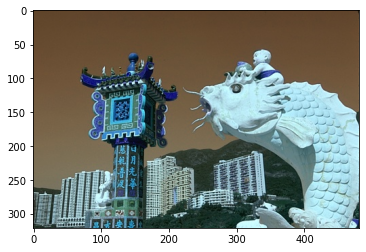

In [ ]:
gen_data('images/test',cr,p_size,'images/test_patches')
gen_data('images/train',cr,p_size,'images/train_patches')
print()

### Testing

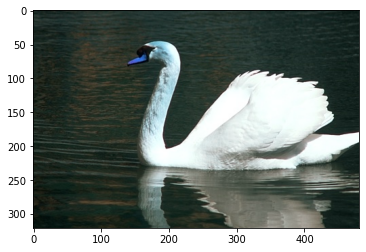

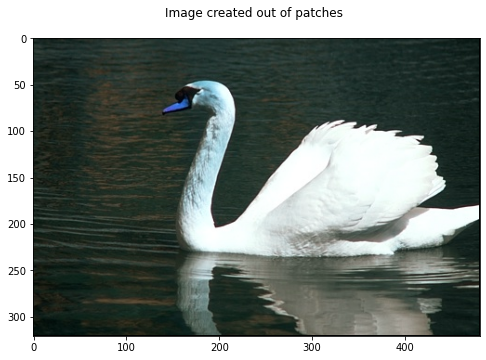

In [ ]:
patches=generate_patches("images/train/8068.jpg",40,[1]) 
test_image=cv2.imread('images/train/8068.jpg')
patches=np.array(patches)
image_created=genimage(patches,test_image.shape)
fig= plt.figure(figsize=(8,8))
plt.imshow(image_created/255.)
plt.title('Image created out of patches \n')
plt.show()

In [ ]:
trainfilenames=os.listdir('images/train_patches')
testfilenames=os.listdir('images/test_patches')
print(len(trainfilenames), len(testfilenames))

87200 21800


### Preparing Dataset

In [ ]:
for i in range(len(trainfilenames)):
  trainfilenames[i]='images/train_patches/'+trainfilenames[i]
for i in range(len(testfilenames)):
  testfilenames[i]='images/test_patches/'+testfilenames[i]

In [ ]:
def addnoise(filename):
  img_raw=tf.io.read_file(filename)
  img = tf.image.decode_jpeg(img_raw, channels=3)
  img = tf.cast(img, tf.float32)/255.
  noise_level=np.random.choice(NOISE_LEVELS)
  noisy_image=img+tf.random.normal(shape=(p_size,p_size,3),mean=0,stddev=noise_level/255)
  noisy_image=tf.clip_by_value(noisy_image, clip_value_min=0., clip_value_max=1.)
  return noisy_image,img

def calc_PSNR(im1,im2,max):
  temp=np.mean((im1-im2)**2)
  if temp==0:
    return 100
  else:
    return 20*np.log10(max/ (np.sqrt(temp)))

def predict_fun(model,image_path,noise_level=30):
  patches=np.array(generate_patches(image_path,p_size,[1]))
  test_image=cv2.imread(image_path)
  patches = patches.astype('float32') /255.
  patches = patches+ tf.random.normal(shape=patches.shape,mean=0,stddev=noise_level/255) 
  patches = tf.clip_by_value(patches, clip_value_min=0., clip_value_max=1.)
  noisy_image=genimage(patches,test_image.shape)
  denoised_patches=model.predict(patches)
  denoised_patches=tf.clip_by_value(denoised_patches, clip_value_min=0., clip_value_max=1.)
  out_img=genimage(denoised_patches,test_image.shape)
  return patches,denoised_patches,test_image/255.,noisy_image,out_img

def plot(noiseless,noisy,out_img):
  b,g,r = cv2.split(noiseless)
  noiseless = cv2.merge([r,g,b])
  b,g,r = cv2.split(noisy)
  noisy = cv2.merge([r,g,b])
  b,g,r = cv2.split(out_img)
  out_img = cv2.merge([r,g,b])
  fig = plt.figure(figsize=(100, 100))
  fig.add_subplot(5, 5, 1)
  plt.imshow(noiseless)
  fig.add_subplot(5, 5, 2)
  plt.imshow(noisy)
  fig.add_subplot(5, 5, 3)
  plt.imshow(out_img)
  plt.show()


In [ ]:
plot(cv2.imread('images/test/8068.jpg'),cv2.imread('images/test/8068.jpg'),cv2.imread('images/test/8068.jpg'))

In [ ]:
BATCH_SIZE=64
NOISE_LEVELS=[15,25,50] 

#Creating the Dataset
train_dataset = tf.data.Dataset.from_tensor_slices(np.array(trainfilenames)) 
train_dataset = train_dataset.map(addnoise)
train_dataset = train_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.from_tensor_slices(np.array(testfilenames))
test_dataset = test_dataset.map(addnoise)
test_dataset = test_dataset.batch(BATCH_SIZE)

Tensor("ReadFile:0", shape=(), dtype=string)
Tensor("ReadFile:0", shape=(), dtype=string)


# DNCNN Model

In [ ]:
def DNCNN():
  input=layers.Input((p_size,p_size,3),name='in')
  temp=layers.Conv2D(64,kernel_size= (3,3), padding='same',name='conv0')(input)
  temp=layers.Activation('relu',name='act0')(temp)
  for i in range(20):
      temp=layers.Conv2D(64, kernel_size=(3,3), padding='same',name='conv'+str(i+1))(temp)
      temp=layers.BatchNormalization(axis=-1,name='BN'+str(i+1))(temp)
      temp=layers.Activation('relu',name='act'+str(i+1))(temp)   
  temp=layers.Conv2D(3, kernel_size=(3,3), padding='same',name='conv_last')(temp)
  temp=layers.Subtract(name='subtract')([input, temp])   
  model = Model(input,temp)
  return model

def lrscheduler(epoch,lr):
  return lr*0.95

In [ ]:
dncnn=DNCNN()
dncnn.compile(optimizer=tf.keras.optimizers.Adam(1e-03),loss=tf.keras.losses.MeanSquaredError())


In [ ]:
dncnn.summary()

In [ ]:
checkpoint_path = "dncnn.h5" # For each epoch creaking a checkpoint
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=False,verbose=0,save_best_only=False) # To save the model if the metric is improved

# Tensorbaord 
# ! rm -rf ./logs_dncnn/  # Removing all the files present in the directory
logdir = os.path.join("logs_dncnn", datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Directory for storing the logs that are required for tensorboard
%reload_ext  tensorboard
%tensorboard --logdir $logdir
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

lrScheduler1 = tf.keras.callbacks.LearningRateScheduler(lrscheduler)

callbacks = [cp_callback,tensorboard_callback,lrScheduler1]
# dncnn.fit( train_dataset,shuffle=True,epochs=10,validation_data= test_dataset,callbacks=callbacks)

<IPython.core.display.Javascript object>

In [ ]:
dncnn.fit( train_dataset,shuffle=True,epochs=30,initial_epoch=10,validation_data= test_dataset,callbacks=callbacks)

Epoch 11/30
1363/1363 [==============================] - 295s 215ms/step - loss: 0.0013 - val_loss: 0.0087 - lr: 5.6880e-04
Epoch 12/30
1363/1363 [==============================] - 230s 169ms/step - loss: 0.0012 - val_loss: 0.0123 - lr: 5.4036e-04
Epoch 13/30
1363/1363 [==============================] - 233s 171ms/step - loss: 0.0012 - val_loss: 0.5042 - lr: 5.1334e-04
Epoch 14/30
1363/1363 [==============================] - 217s 159ms/step - loss: 0.0012 - val_loss: 2.4306 - lr: 4.8767e-04
Epoch 15/30
1363/1363 [==============================] - 238s 175ms/step - loss: 0.0013 - val_loss: 0.0012 - lr: 4.6329e-04
Epoch 16/30
1363/1363 [==============================] - 216s 158ms/step - loss: 0.0012 - val_loss: 0.0011 - lr: 4.4013e-04
Epoch 17/30
1363/1363 [==============================] - 231s 169ms/step - loss: 0.0013 - val_loss: 0.0011 - lr: 4.1812e-04
Epoch 18/30
1363/1363 [==============================] - 216s 158ms/step - loss: 0.0015 - val_loss: 0.0011 - lr: 3.9721e-04
Epoch 19

In [ ]:
dncnn=tf.keras.models.load_model("dncnn_final.h5")

Calculating Avg PSNR

In [ ]:
testfilenames=os.listdir('images/test')

In [ ]:
print('Using DNCNN Model')
x=0
y=0
for j in [15,20,30,40]:
  x=0
  y=0
  for i in testfilenames:
    if i!='Thumbs.db':
      t,t,test_image,noisy_image,out_img=predict_fun(dncnn,'images/test/'+i,noise_level=j)
      x+=calc_PSNR(test_image,noisy_image,1)
      y+=calc_PSNR(test_image,out_img,1)
  x=x/len(testfilenames)
  y=y/len(testfilenames)
  print(x,y)

Using DNCNN Model
23.573382086185923 26.774741586873848
21.564151547619367 26.64170230250068
18.554121947702694 25.70636183211127
16.392118742442594 23.646545442949208


In [ ]:
ridnet=tf.keras.models.load_model("ridnet_final.h5")

In [ ]:
# img = noisy_image
# min_val,max_val=img.min(),img.max()
# img = 255.0*(img - min_val)/(max_val - min_val)
# img = img.astype(np.uint8)
# cv2.imwrite("/content/tiger_50.jpg",img)

True

Calculating average PSNR for RIDNET

In [ ]:
print('Using RIDNET Model')
x=0
y=0
for j in [15,20,30,40]:
  x=0
  y=0
  for i in testfilenames:
    if i!='Thumbs.db':
      t,t,test_image,noisy_image,out_img=predict_fun(ridnet,'images/test/'+i,noise_level=j)
      x+=calc_PSNR(test_image,noisy_image,1)
      y+=calc_PSNR(test_image,out_img,1)
  x=x/len(testfilenames)
  y=y/len(testfilenames)
  print(x,y)

Using RIDNET Model
23.574670644357745 27.64134646043498
21.563182238028244 27.670405521546183
18.55389407759026 26.37803792731321
16.389922532181384 23.032551889970712


Using RIDNET Model
PSNR of Noisy Image :  18.795769120887055
PSNR of Denoised Image :  27.676522333105815


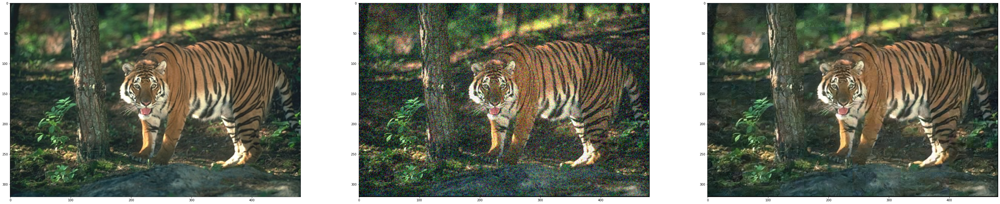

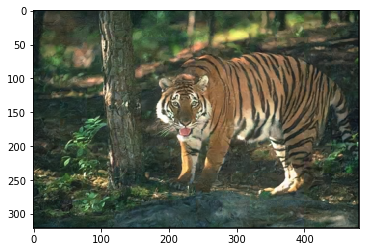

In [ ]:
print('Using RIDNET Model')
patches,denoised_patches,test_image,noisy_image,out_img=predict_fun(ridnet,'images/test/108005.jpg',noise_level=30)
print('PSNR of Noisy Image : ',calc_PSNR(test_image,noisy_image,1))
print('PSNR of Denoised Image : ',calc_PSNR(test_image,out_img,1))
plot(test_image,noisy_image,out_img)
# b,g,r = cv2.split(out_img)
# out_img = cv2.merge([r,g,b])
# plt.imshow(out_img)

In [ ]:
model_res=Model(ridnet.input,ridnet.get_layer('conv2d_49').output)
t,t,test_image,noisy_image,out_img=predict_fun(model_res,'images/test/108005.jpg',noise_level=30)

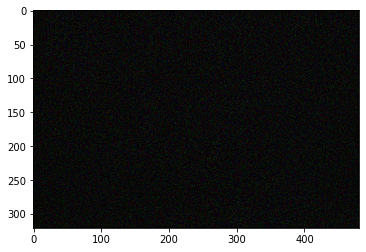

In [ ]:

plt.imshow(out_img)

In [ ]:
# x=out_img+noisy_image
# plt.imshow(x)
calc_PSNR(test_image,out_img,1)

29.465158950552425

In [ ]:
t,t,test_image,noisy_image,out_img=predict_fun(ridnet,'images/test/108005.jpg',noise_level=20)
calc_PSNR(test_image,out_img,1)

29.44952718278202